In [1]:
import json
from collections import defaultdict
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

with open("./dataset/train.json",'r') as f:
    json_data = json.load(f)
print(json.dumps(json_data,indent="\t"))

{
	"info": {
		"year": 2021,
		"version": "1.0",
		"description": "Recycle Trash",
		"contributor": "Upstage",
		"url": null,
		"date_created": "2021-02-02 01:10:00"
	},
	"licenses": [
		{
			"id": 0,
			"name": "CC BY 4.0",
			"url": "https://creativecommons.org/licenses/by/4.0/deed.ast"
		}
	],
	"images": [
		{
			"width": 1024,
			"height": 1024,
			"file_name": "train/0000.jpg",
			"license": 0,
			"flickr_url": null,
			"coco_url": null,
			"date_captured": "2020-12-26 14:44:23",
			"id": 0
		},
		{
			"width": 1024,
			"height": 1024,
			"file_name": "train/0001.jpg",
			"license": 0,
			"flickr_url": null,
			"coco_url": null,
			"date_captured": "2021-01-10 16:30:39",
			"id": 1
		},
		{
			"width": 1024,
			"height": 1024,
			"file_name": "train/0002.jpg",
			"license": 0,
			"flickr_url": null,
			"coco_url": null,
			"date_captured": "2020-12-27 17:55:52",
			"id": 2
		},
		{
			"width": 1024,
			"height": 1024,
			"file_name": "train/0003.jpg",
			"license": 0,
			"flickr_u

In [2]:
print(json_data.keys())

dict_keys(['info', 'licenses', 'images', 'categories', 'annotations'])


In [3]:
print(json_data['categories'])
x_ticks = [i['name'] for i in json_data['categories']]
print(x_ticks)

[{'id': 0, 'name': 'General trash', 'supercategory': 'General trash'}, {'id': 1, 'name': 'Paper', 'supercategory': 'Paper'}, {'id': 2, 'name': 'Paper pack', 'supercategory': 'Paper pack'}, {'id': 3, 'name': 'Metal', 'supercategory': 'Metal'}, {'id': 4, 'name': 'Glass', 'supercategory': 'Glass'}, {'id': 5, 'name': 'Plastic', 'supercategory': 'Plastic'}, {'id': 6, 'name': 'Styrofoam', 'supercategory': 'Styrofoam'}, {'id': 7, 'name': 'Plastic bag', 'supercategory': 'Plastic bag'}, {'id': 8, 'name': 'Battery', 'supercategory': 'Battery'}, {'id': 9, 'name': 'Clothing', 'supercategory': 'Clothing'}]
['General trash', 'Paper', 'Paper pack', 'Metal', 'Glass', 'Plastic', 'Styrofoam', 'Plastic bag', 'Battery', 'Clothing']


In [4]:
print(len(json_data['images']))
print(json_data['images'][0])
print(json_data['images'][-1])


4883
{'width': 1024, 'height': 1024, 'file_name': 'train/0000.jpg', 'license': 0, 'flickr_url': None, 'coco_url': None, 'date_captured': '2020-12-26 14:44:23', 'id': 0}
{'width': 1024, 'height': 1024, 'file_name': 'train/4882.jpg', 'license': 0, 'flickr_url': None, 'coco_url': None, 'date_captured': '2020-12-23 16:20:30', 'id': 4882}


In [5]:
print(len(json_data['annotations']))
print(json_data['annotations'][0])
print(json_data['annotations'][2233])
print(json_data['annotations'][-1])

23144
{'image_id': 0, 'category_id': 0, 'area': 257301.66, 'bbox': [197.6, 193.7, 547.8, 469.7], 'iscrowd': 0, 'id': 0}
{'image_id': 453, 'category_id': 7, 'area': 81098.08, 'bbox': [385.3, 816.4, 391.4, 207.2], 'iscrowd': 0, 'id': 2233}
{'image_id': 4882, 'category_id': 1, 'area': 149633.22, 'bbox': [145.4, 295.4, 420.2, 356.1], 'iscrowd': 0, 'id': 23143}


In [6]:
df = pd.DataFrame({'image_id':[], "category_id":[], 'bbox_x':[], 'bbox_y':[], 'bbox_w':[], 'bbox_h':[], 'ratio':[], 'area':[]})
for i,info in enumerate(json_data['annotations']):
    df.loc[i] = [
        int(info['image_id']), 
        int(info['category_id']), 
        info['bbox'][0], 
        info['bbox'][1],
        info['bbox'][2],
        info['bbox'][3],
        round(info['bbox'][2]/info['bbox'][3],1),
        info['area'],
        ]

print(df.head())


   image_id  category_id  bbox_x  bbox_y  bbox_w  bbox_h  ratio       area
0       0.0          0.0   197.6   193.7   547.8   469.7    1.2  257301.66
1       1.0          3.0     0.0   407.4    57.6   180.6    0.3   10402.56
2       1.0          7.0     0.0   455.6   144.6   181.6    0.8   26259.36
3       1.0          4.0   722.3   313.4   274.3   251.9    1.1   69096.17
4       1.0          5.0   353.2   671.0   233.7   103.4    2.3   24164.58


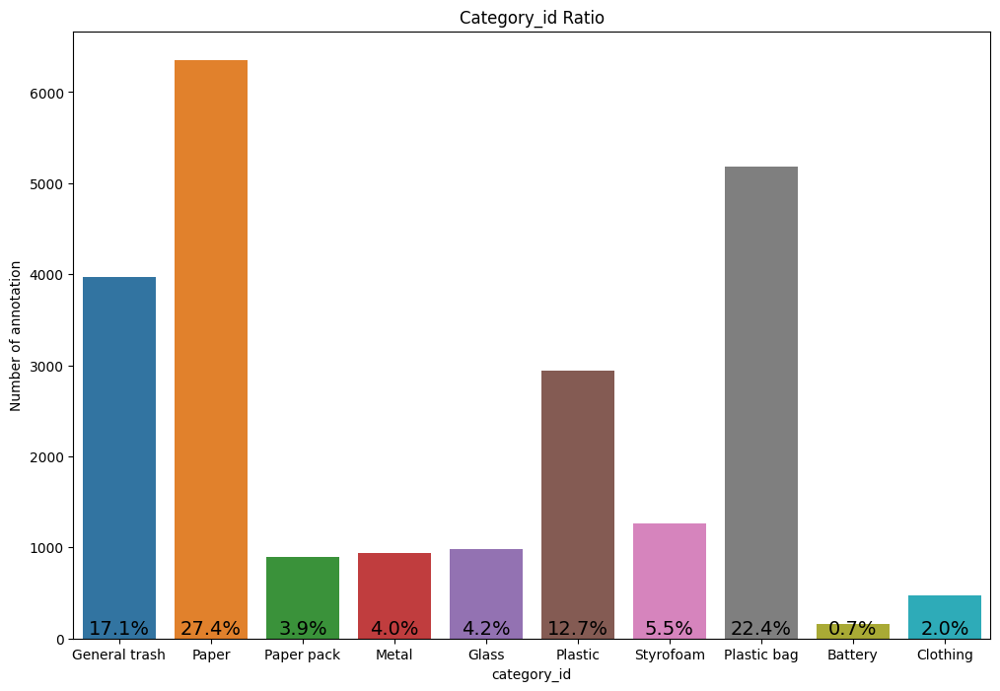

In [7]:
plt.figure(figsize = (12,8))
ax = sns.countplot(x ='category_id', data=df)
plt.title("Category_id Ratio")
plt.ylabel("Number of annotation")
plt.xticks(range(len(x_ticks)),x_ticks)
count = df['category_id'].value_counts()
count = dict(sorted(count.items()))

counts = [f'{elem/sum(count.values()) * 100:.1f}%' for elem in count.values()]
for i,v in enumerate(counts):
    ax.text(i,50,v,horizontalalignment='center', size= 14, color="black")

plt.show()

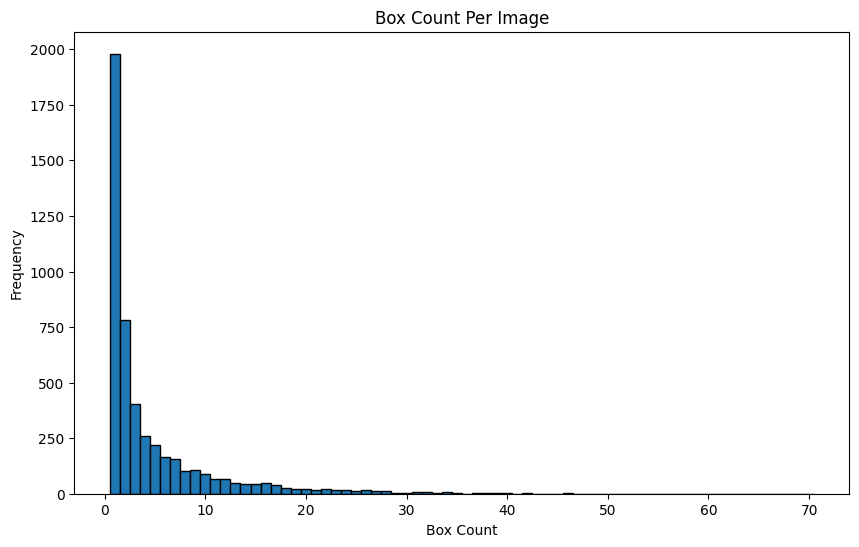

In [8]:
# 각 이미지의 박스 개수 계산
box_counts = df.groupby('image_id')['category_id'].count()

# 히스토그램 그리기
plt.figure(figsize=(10, 6))
plt.hist(box_counts, bins=70, edgecolor='black',align='left')
plt.xlabel('Box Count')
plt.ylabel('Frequency')
plt.title('Box Count Per Image')
plt.show()

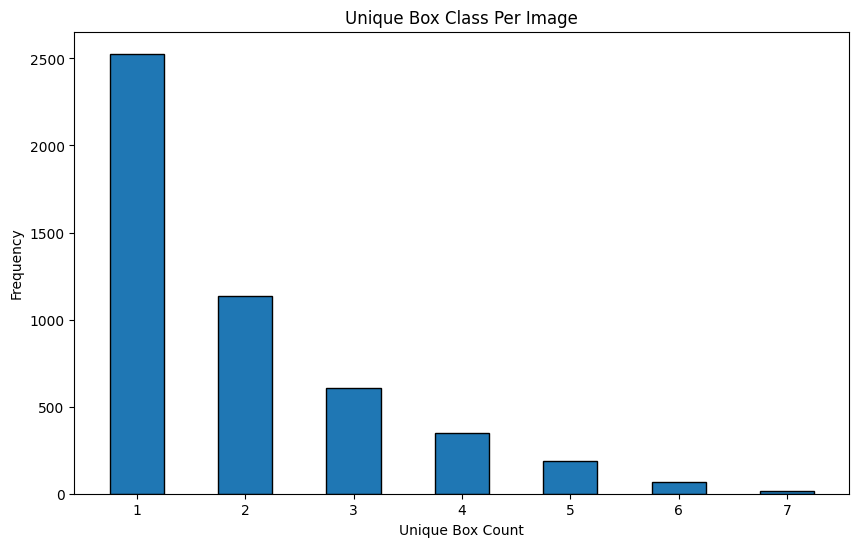

In [9]:
# 각 이미지의 클래스 계산
unique_box = df.groupby('image_id')['category_id'].nunique()

plt.figure(figsize=(10, 6))
plt.hist(unique_box, bins=range(1, unique_box.max()+2), edgecolor='black',rwidth=0.5, align='left')
plt.xlabel('Unique Box Count')
plt.ylabel('Frequency')
plt.title('Unique Box Class Per Image')
plt.show()

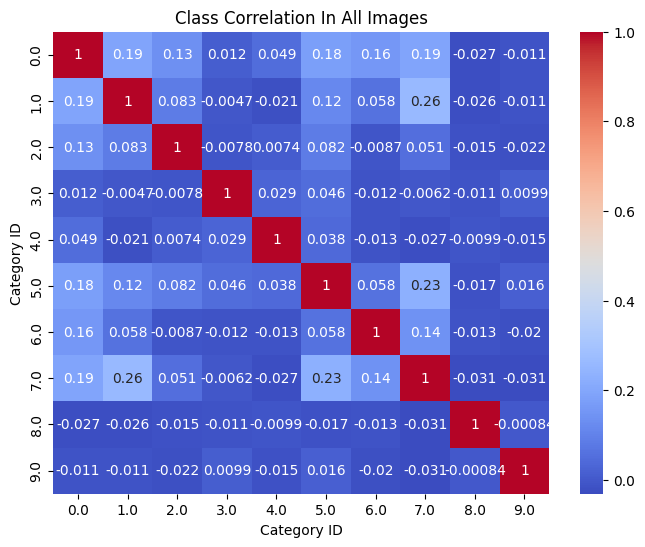

In [10]:
# 모든 이미지에 대한 상관관계
class_counts = df['category_id'].value_counts()

# 클래스 간의 상관 행렬 생성
correlation_matrix = df.groupby('image_id')['category_id'].value_counts().unstack(fill_value=0)
correlation_matrix = correlation_matrix.corr()

# 상관 행렬 시각화
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.xlabel('Category ID')
plt.ylabel('Category ID')
plt.title('Class Correlation In All Images')
plt.show()

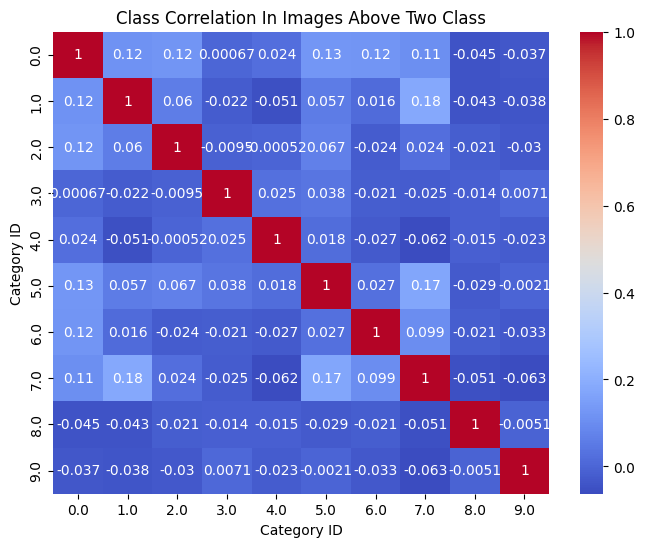

In [11]:
# 박스가 2개 이상
class_counts = df['category_id'].value_counts()

group = df.groupby('image_id')['category_id'].apply(list)

filter_group = group[group.apply(len)>1]
correlation_matrix = filter_group.explode().reset_index().pivot_table(
    index='image_id', columns='category_id', aggfunc='size', fill_value=0)
correlation_matrix = correlation_matrix.corr()

# 상관 행렬 시각화
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.xlabel('Category ID')
plt.ylabel('Category ID')
plt.title('Class Correlation In Images Above Two Class')
plt.show()

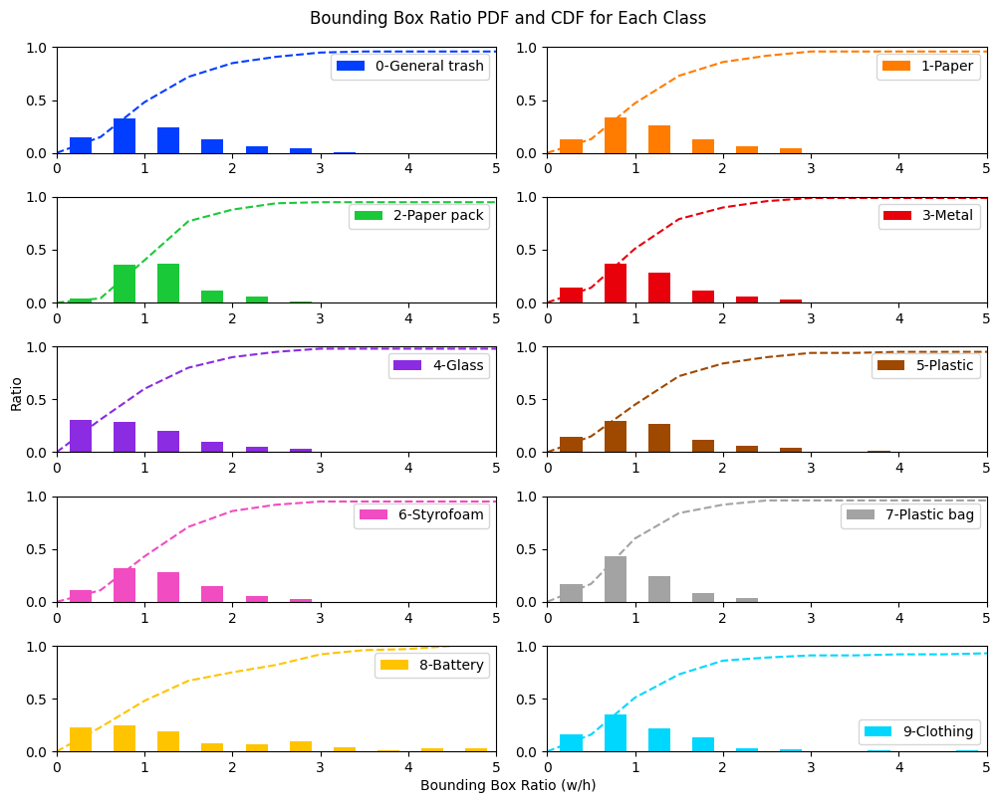

In [12]:
ratio_count = df.groupby(['category_id', 'ratio']).size().reset_index(name='count')

# count_ratio 계산
class_counts = df['category_id'].value_counts()
ratio_count['count_ratio'] = ratio_count.apply(lambda row: round(row['count'] / class_counts[int(row['category_id'])], 2), axis=1)

default_palette = sns.color_palette('bright')[:10]
fig, axs = plt.subplots(5, 2, figsize=(10, 8))

for category_id in range(10):
    category_data = ratio_count[ratio_count['category_id'] == category_id]

    # PDF 그래프
    pdf_data = pd.DataFrame({'ratio': np.arange(0, category_data['ratio'].max() + 0.5, 0.5)})
    pdf_data['pdf'] = pdf_data['ratio'].apply(lambda x: category_data[category_data['ratio'] <= x]['count_ratio'].sum())
    pdf_data['pdf'] = pdf_data['pdf'] - pdf_data['pdf'].shift(1).fillna(0)  # 누적이 아닌 차분 값 계산
    axs[category_id // 2, category_id % 2].bar(pdf_data['ratio']-0.35, pdf_data['pdf'], width=0.25, align='edge', color=default_palette[category_id], label=f'{category_id}-{x_ticks[category_id]}')

    # CDF 그래프
    cdf_data = pd.DataFrame({'ratio': pdf_data['ratio'], 'cdf': np.cumsum(pdf_data['pdf'])})
    axs[category_id // 2, category_id % 2].plot(cdf_data['ratio'], cdf_data['cdf'], linestyle='--', color=default_palette[category_id])

    axs[category_id // 2, category_id % 2].set_xlim(0, 5)
    axs[category_id // 2, category_id % 2].set_ylim(0, 1)
    axs[category_id // 2, category_id % 2].set_xlabel("")
    axs[category_id // 2, category_id % 2].set_ylabel("")
    axs[category_id // 2, category_id % 2].legend()

plt.suptitle('Bounding Box Ratio PDF and CDF for Each Class')
fig.text(0.5, 0.00, 'Bounding Box Ratio (w/h)', ha='center')
fig.text(0.0, 0.5, 'Ratio', va='center', rotation='vertical')
plt.tight_layout()
plt.show()

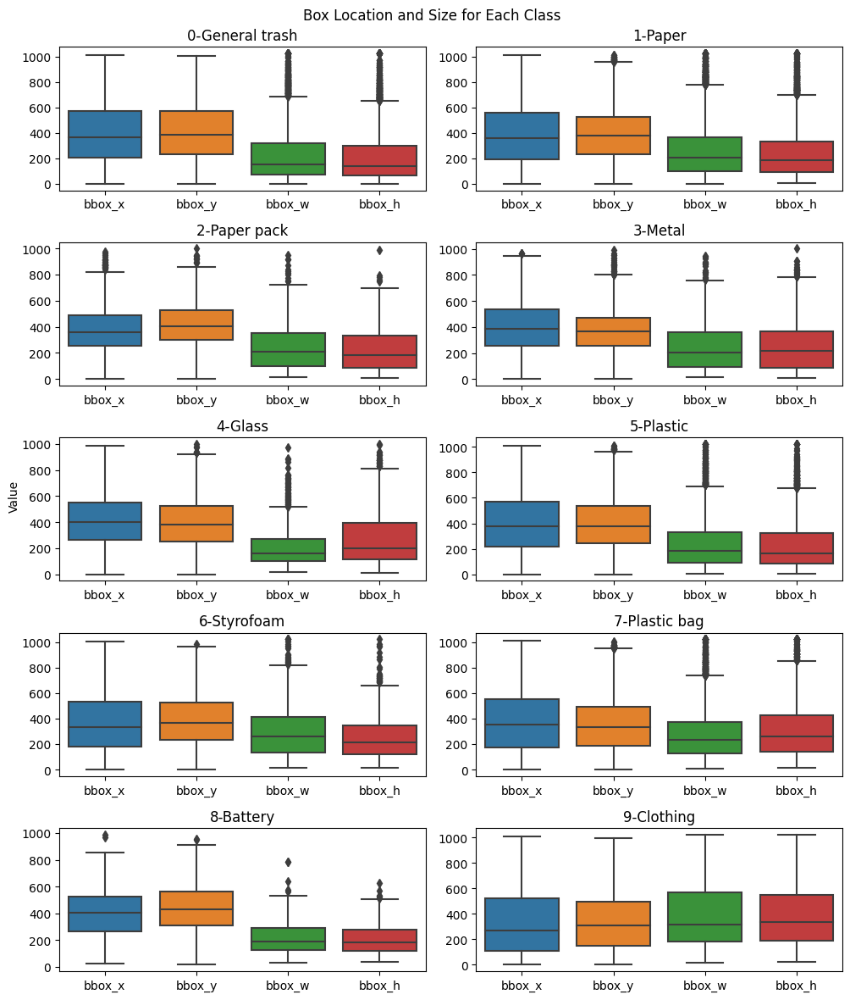

In [16]:
bbox_data = df[['bbox_x', 'bbox_y', 'bbox_w', 'bbox_h']]

# Figure 생성
fig, axs = plt.subplots(5, 2, figsize=(10, 12))

# 클래스별로 반복하여 subplot에 박스 위치 및 크기 정보 시각화
for i, (category, data) in enumerate(bbox_data.groupby(df['category_id'])):
    ax = axs[i // 2, i % 2]
    sns.boxplot(data=data, ax=ax)
    ax.set_title(f'{i}-{x_ticks[i]}')
    ax.set_xlabel("")
    ax.set_ylabel("")

plt.suptitle('Box Location and Size for Each Class')
fig.text(0.0, 0.5, 'Value', va='center', rotation='vertical')
plt.tight_layout()
plt.show()


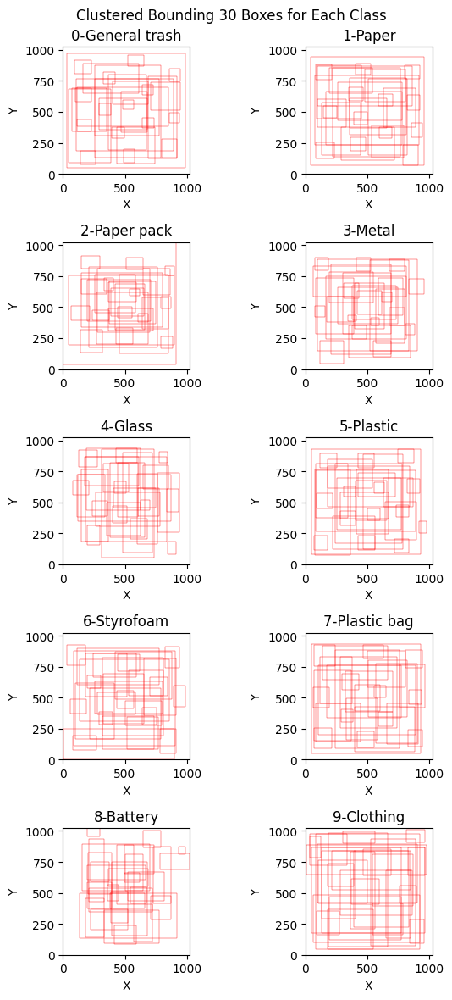

In [20]:
from sklearn.cluster import KMeans
from matplotlib.patches import Rectangle

# 데이터 설정
bbox_data = df[['bbox_x', 'bbox_y', 'bbox_w', 'bbox_h']]
class_counts = df['category_id'].value_counts()

# 클래스별 클러스터 개수 설정
n_clusters = (class_counts // 10).clip(1)

# 클래스별로 반복하여 subplot에 박스 그리기
fig, axs = plt.subplots(5, 2, figsize=(6, 12))
for i, (category, data) in enumerate(bbox_data.groupby(df['category_id'])):
    ax = axs[i // 2, i % 2]
    
    # 클러스터 개수 설정
    num_clusters = 30
    
    # 클러스터링 모델 생성
    clustering_model = KMeans(n_clusters=num_clusters)
    
    # 클러스터링 수행
    clustering_labels = clustering_model.fit_predict(data)
    unique_labels = np.unique(clustering_labels)
    
    # 대표적인 박스 선택 및 그리기
    for label in unique_labels:
        cluster_data = data[clustering_labels == label]
        representative_box = cluster_data.mean()
        
        rect = Rectangle((representative_box['bbox_x'], representative_box['bbox_y']), representative_box['bbox_w'], representative_box['bbox_h'], linewidth=0.3, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    
    
    ax.set_xlim(0, 1024)  # X축 범위 설정
    ax.set_ylim(0, 1024)  # Y축 범위 설정
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_title(f'{i}-{x_ticks[i]}')
    ax.set_aspect('equal')  # X축과 Y축의 스케일을 동일하게 설정
    
plt.suptitle(f'Clustered Bounding {num_clusters} Boxes for Each Class')
plt.tight_layout()
plt.show()